# MIOFlow to infer trajectories on PHATE space

Prerequisites:
- You have preprocessed your data and saved a mioflow DataFrame [notebook: 5-mioflow-prep]: 
    - rows are cells
    - columns are embeddings dimensions


In this notebook, we will:
- Run MIOFlow on our PHATE space to infer trajectories

# TODO: BETTER DESCRIPTION OF THIS NOTEBOOK

In [ ]:
from MIOFlow.utils import generate_steps, set_seeds, config_criterion
from MIOFlow.models import make_model, Autoencoder
from MIOFlow.plots import plot_comparision, plot_losses
from MIOFlow.train import train_ae, training_regimen

from MIOFlow.geo import setup_distance
from MIOFlow.exp import setup_exp
from MIOFlow.eval import generate_plot_data

import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'

import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

PROCESSED_DATA_DIR = os.path.join('../../data', 'processed')
DIMENSION_CHANGER_DIR = os.path.join('../../dimension_changer')
RESULTS_DIR = os.path.join('../../results')

data_name = 'adata'
SAVE_PATH = os.path.join(RESULTS_DIR, data_name)


We first retrieve the MIOFlow dataframe and get it's embeddings and labels(samples).

We take the first dimension mean and std because those are the most important values.
# TODO: explain the std and mean 

In [36]:
data = pd.read_csv(os.path.join(SAVE_PATH,'mioflow_data_10d.csv'))

In [37]:
# Get embedding columns dynamically
embed_cols = [col for col in data.columns if col.startswith('d') and col[1:].isdigit()]
embedding = data[embed_cols].values

# Normalize across all dimensions properly
mean_vals = np.mean(embedding, axis=0)
std_vals = np.std(embedding, axis=0)
std_vals = np.where(std_vals == 0, 1, std_vals)  # Prevent division by zero
normalized = (embedding - mean_vals) / std_vals

In [38]:
# Create result dataframe with normalized embeddings
df = pd.DataFrame(normalized, columns=[f'd{i+1}' for i in range(normalized.shape[1])])
df['samples'] = data['samples']


# Balance dataset by taking equal samples from each class
min_count = df['samples'].value_counts().min()
df = df.groupby('samples').apply(lambda x: x.sample(min_count)).reset_index(drop=True)

<Axes: xlabel='d1', ylabel='d2'>

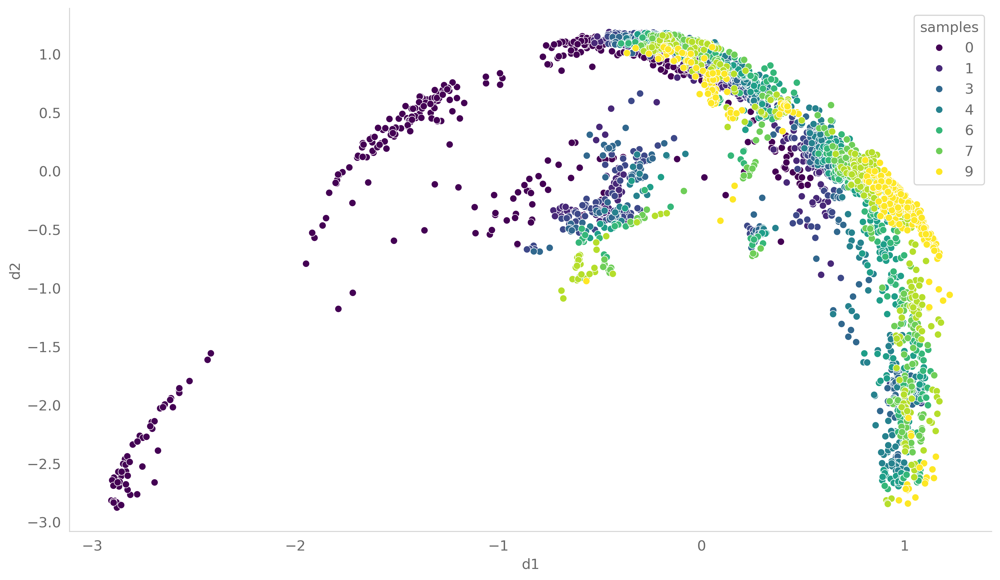

In [39]:
fig = plt.figure(figsize=(14, 8), dpi=300)
sns.scatterplot(data=df, x='d1', y='d2', hue='samples', palette='viridis')

In [40]:
import torch
set_seeds(0)
use_cuda = torch.cuda.is_available()

In [41]:
# The dimensions in the input space, it is columns - 1 because we assume one column is equal to "samples".
model_features = len(df.columns) - 1
groups = sorted(df.samples.unique())

In [42]:
# These determine the logic flow for training: 

#   use_emb=True use_gae=False is only the encoder to match the approximation of the geodesic.
#   use_emb=False use_gae=True the full Geodesic Autoencoder (GAE), i.e. matching the geodesic and a reconstruction loss.
#   use_emb=False use_gae=False Is not using the GAE.
#   use_emb=True use_gae=True, is redundant and should raise an error. 

use_emb = False
use_gae = False

need_to_train_gae = (use_emb or use_gae) and use_emb != use_gae

# If the reconstruction loss needs to be computed.
recon = use_gae and not use_emb 

# These are training GAE hyperparameters needed for training
# Distance_type in ['gaussian', 'alpha_decay'], and Gaussian scale

distance_type = 'alpha_decay'
rbf_length_scale=0.001
knn=5
t_max=5
dist = setup_distance(distance_type, rbf_length_scale=rbf_length_scale, knn=knn, t_max=t_max)

#Can be changed depending on the dataset
n_epochs_emb = 1500
samples_size_emb = (50, )

# Layers for the Geodesic Autoencoder
gae_embedded_dim = 50
encoder_layers = [model_features, 100, 100, gae_embedded_dim]

gae = Autoencoder(
    encoder_layers = encoder_layers,
    decoder_layers = encoder_layers[::-1],
    activation='ReLU', use_cuda = use_cuda
)
optimizer = torch.optim.AdamW(gae.parameters())

In [43]:
# Added in extra cell just for iterative programming / running of code
#   but could be added to code block above
import time
if need_to_train_gae:
    start_time_geo = time.time()

    losses = train_ae(
        gae, df, groups, optimizer, 
        n_epochs=n_epochs_emb, sample_size=samples_size_emb,
        noise_min_scale=0.09, noise_max_scale=0.15, 
        dist=dist, recon=recon, use_cuda=use_cuda,
        hold_one_out=False,
    )
    run_time_geo = time.time() - start_time_geo

    print(run_time_geo)
    autoencoder = gae
else:
    autoencoder = None

In [44]:
#TODO: verify if this is necessary
set_seeds(10)

# Density loss knn
use_density_loss = True

# Weight of density (not percentage of total loss)
lambda_density = 20

# For petal=LeakyReLU / dyngen=CELU
activation = 'CELU'

# Can change but we never really do, mostly depends on the dataset.
layers = [16,32,16]

# Scale of the noise in the trajectories. Either len(groups)*[float] or None. Should be None if using an adaptative ODE solver.
# sde_scales = len(groups)*[0.2]

"""
TODO: 
    if we don't rescale data by dim, the later dims are much smaller in magnitude
    this needs the sde_scales to also be scaled by dim -- e.g. some constant times the std of that dim
    this is not implemented yet. 
    So we just use ODE here. need to implement the scales by dim.
"""
sde_scales = None 

if recon:    
    model_features = gae_embedded_dim

model = make_model(
    model_features, layers, 
    activation=activation,
    scales=sde_scales, 
    use_cuda=use_cuda
)

In [45]:
# Basically "batch size"
sample_size=(min(min_count, 100), )

# Training specification
n_local_epochs = 40
n_epochs = 40
n_post_local_epochs = 0

# Using the reverse trajectories to train
reverse_schema = True
# each reverse_n epoch
reverse_n = 2


criterion_name = 'ot'
criterion = config_criterion(criterion_name)

optimizer = torch.optim.AdamW(model.parameters())

# Bookkeeping variables
batch_losses = []
globe_losses = []

# This is True if we want to holdout (or skip) one timepoint during training. 
# It is used to test the accuracy of the trajectories on unseen data.

hold_one_out = False

# It can be a group number or 'random', works in tandem with hold_one_out
# hold_out = 3
hold_out = False


if hold_one_out and hold_out in groups:
    groups_ho = [g for g in groups if g != hold_out]
    local_losses = {f'{t0}:{t1}':[] for (t0, t1) in generate_steps(groups_ho)}
else:
    local_losses = {f'{t0}:{t1}':[] for (t0, t1) in generate_steps(groups)}

# For creating output.
n_points = min(min_count, 100)
n_trajectories = min(min_count, 100)
n_bins = 100 # corrected.

In [46]:
opts = {
    'pca_dims': 100,
    'use_cuda': use_cuda,
    'model_features': model_features,
    'exp_name': data_name,
    'groups': groups,
    'sample_size': sample_size,
    'use_emb': use_emb,
    'n_local_epochs': n_local_epochs,
    'n_epochs': n_epochs,
    'n_post_local_epochs': n_post_local_epochs,
    'criterion_name': criterion_name,
    'hold_one_out': hold_one_out,
    'use_density_loss': use_density_loss,
    'n_points': n_points,
    'n_trajectories': n_trajectories,
    'n_bins': n_bins,
    'autoencoder': autoencoder,
    'activation_ode': activation,
    'layer': layers,
    'lambda_density':lambda_density,
    'use_gae': use_gae,
    'sde_scales': sde_scales,
    'encoder_layers': encoder_layers,
    'n_epochs_emb': n_epochs_emb,
    'samples_size_emb': samples_size_emb,
    'recon': recon,
    'distance_type':distance_type,
    'rbf_length_scale':rbf_length_scale,
    'reverse_schema': reverse_schema,
    'reverse_n': reverse_n,
    'knn': knn,
    't_max': t_max
}

In [ ]:
exp_dir, logger = setup_exp(RESULTS_DIR, opts, data_name) 

In [48]:
start_time = time.time()
local_losses, batch_losses, globe_losses = training_regimen(
    # local, global, local train structure
    n_local_epochs=n_local_epochs, 
    n_epochs=n_epochs, 
    n_post_local_epochs=n_post_local_epochs,
    
    # where results are stored
    exp_dir=exp_dir, 

    # BEGIN: train params
    model=model, df=df, groups=groups, optimizer=optimizer, 
    criterion=criterion, use_cuda=use_cuda,
    
    hold_one_out=hold_one_out,
    
    use_density_loss=use_density_loss, 
    lambda_density=lambda_density,
    
    autoencoder=autoencoder, use_emb=use_emb, use_gae=use_gae, 
    
    sample_size=sample_size, logger=logger,
    reverse_schema=reverse_schema, reverse_n=reverse_n,
    # END: train params

    plot_every=5,
    n_points=n_points, n_trajectories=n_trajectories, n_bins=n_bins, 
    #local_losses=local_losses, batch_losses=batch_losses, globe_losses=globe_losses
)
run_time = time.time() - start_time + run_time_geo if use_emb or use_gae else time.time() - start_time
logger.info(f'Total run time: {np.round(run_time, 5)}')

Pretraining Epoch:   0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

/Users/joaofelipe/miniconda3/envs/omics_toolbox/lib/python3.10/site-packages/MIOFlow/plots.py:229: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch:   0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Posttraining Epoch: 0it [00:00, ?it/s]

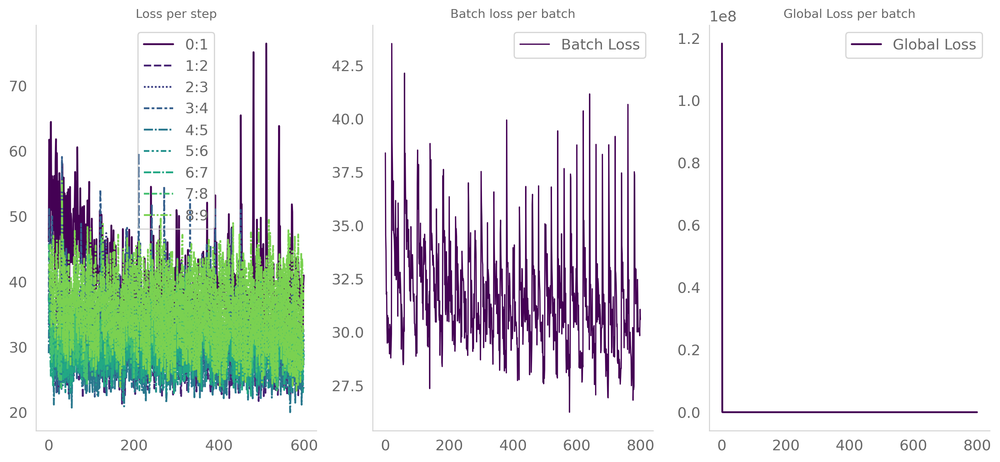

In [49]:
plot_losses(
    local_losses, batch_losses, globe_losses, 
    save=True, path=exp_dir, file='losses.png'
)

In [50]:
generated, trajectoriespts = generate_plot_data(
    model, df, n_points, n_trajectories, n_bins, use_cuda=use_cuda, samples_key='samples', logger=logger,
    autoencoder=autoencoder, recon=recon
)

/Users/joaofelipe/miniconda3/envs/omics_toolbox/lib/python3.10/site-packages/MIOFlow/plots.py:229: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



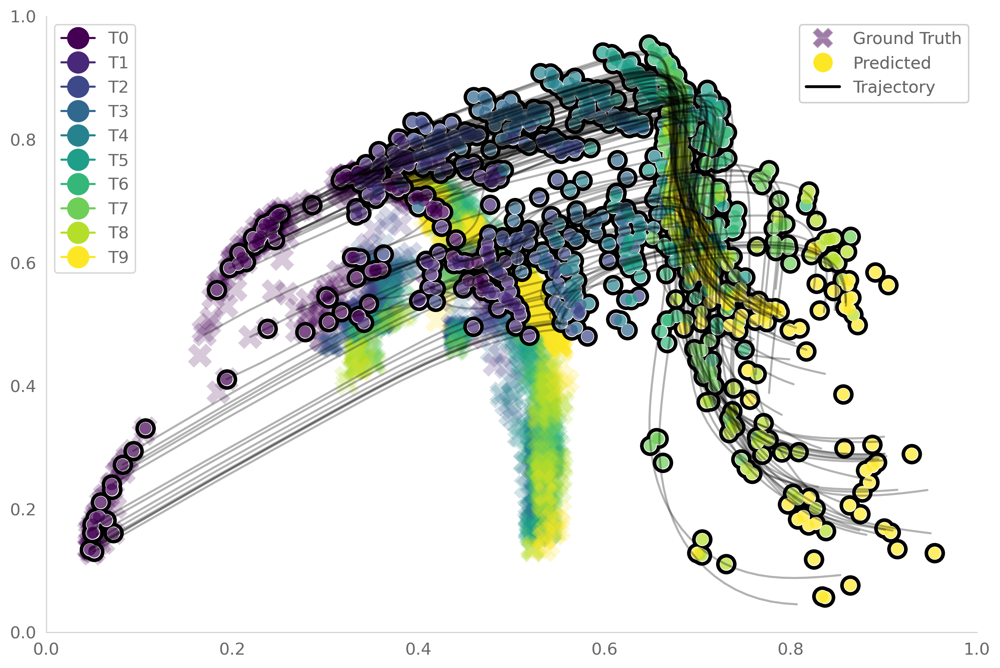

In [51]:
plot_comparision(
    df, generated, trajectoriespts,
    palette = 'viridis', df_time_key='samples',
    save=True, path=exp_dir, file='2d_comparision.png',
    x='d1', y='d2', is_3d=False
)

# Let's make this a new visualization notebook

In [52]:
from plotly3d.plot import scatter, trajectories

In [53]:
# Here we retrieve the mean and std vals from the original embeddings

In [54]:
trajectoriespts = trajectoriespts * std_vals + mean_vals
generated = generated * std_vals + mean_vals
true_data = df[[f'd{i}' for i in range(1, len(df.columns))]] * std_vals + mean_vals

In [55]:
true_data

,d1,d2,d3,d4,d5,d6,d7,d8,d9,d10
0,-0.001629,0.009754,-0.000165,0.003797,-0.002181,-0.004673,-0.000110,0.001114,-0.000213,0.001032
1,-0.044472,-0.024853,-0.007350,0.004416,-0.002630,0.000829,0.000707,-0.001189,0.000501,0.000208
2,-0.016142,-0.005720,0.010032,-0.005424,-0.005222,0.000982,-0.005477,0.000117,-0.001557,0.000824
3,-0.045926,-0.029962,-0.008115,0.005439,-0.003168,0.001120,0.000106,-0.000628,0.000123,-0.000132
4,-0.019616,0.007557,-0.002540,-0.000414,0.003740,0.000618,0.002920,0.002012,-0.001742,0.000123
...,...,...,...,...,...,...,...,...,...,...
4185,0.018453,-0.005692,-0.004129,-0.001685,-0.003045,0.001342,0.003226,-0.001520,-0.000394,0.000556
4186,0.016474,-0.002044,-0.000500,-0.003121,-0.001866,-0.000427,0.002602,-0.001509,0.000063,0.000498
4187,0.015154,-0.003135,-0.002877,0.004777,-0.002181,0.006618,-0.000389,0.003070,0.001269,-0.000281
4188,0.018728,-0.012350,-0.000826,-0.001501,0.002984,-0.001948,0.000198,-0.001042,-0.000307,0.000783


In [56]:
from sklearn.preprocessing import MinMaxScaler

In [57]:
scaler = MinMaxScaler()
scaler.fit(true_data)
trajectories(
    trajectoriespts,
    fig=scatter(
        true_data.values, 
        df['samples'].values,
        scaler=scaler,
        # rescale=False,
        s=5,
        alpha=1,
    ), 
    scaler=scaler,
    s=1,
    # rescale=False,
    filename=os.path.join(exp_dir, 'trajectories.html'),
    title='',
)

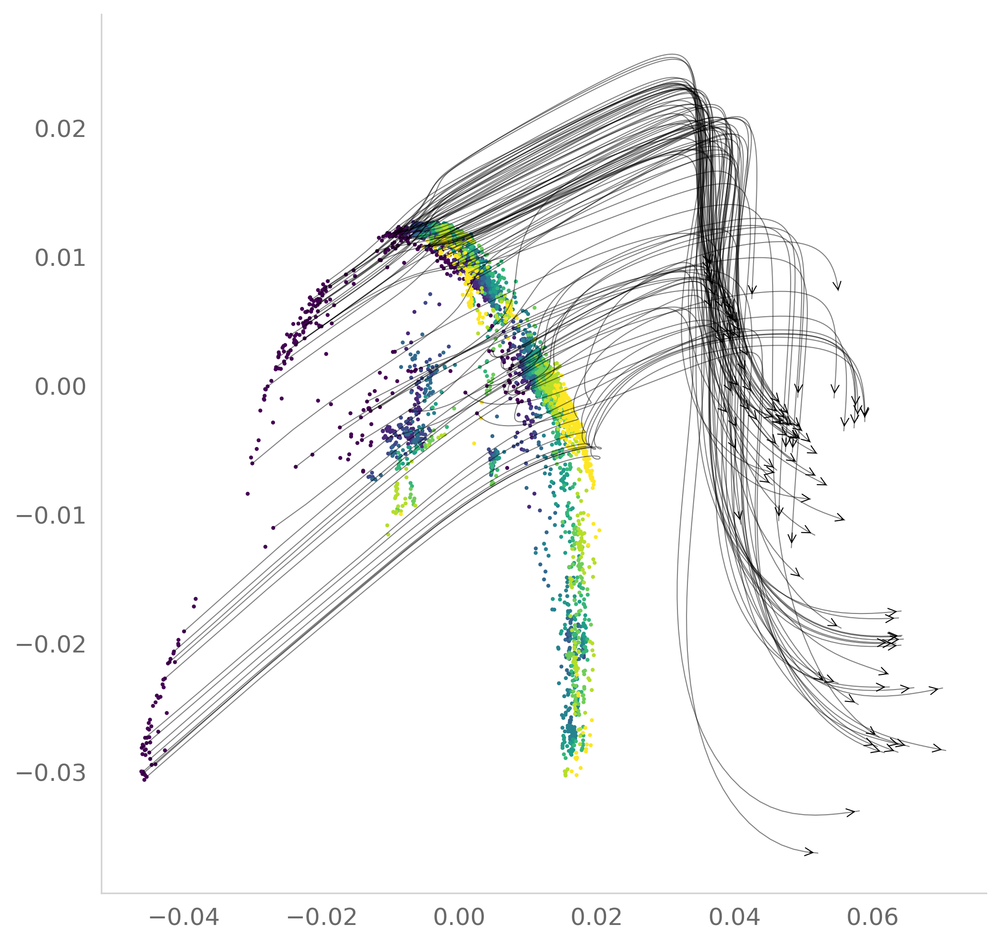

In [58]:
fig = plt.figure(figsize=(8, 8), dpi=300)
plt.scatter(true_data.values[:, 0], true_data.values[:, 1], c=df['samples'].values, cmap='viridis', s=1)
for i,traj in enumerate(np.transpose(trajectoriespts, axes=(1,0,2))):
    # widths = m_traj[:,i]
    plt.plot(traj[:, 0], traj[:, 1], alpha=.5, linewidth=.5, color='Black');
    plt.annotate('', xy=(traj[-1, 0], traj[-1, 1]), xytext=(traj[-2, 0], traj[-2, 1]),
                 arrowprops=dict(arrowstyle='->', color='Black', lw=.5, mutation_scale=10))


In [59]:
from omics_toolbox.dimchanger import DimChanger

dimchanger = DimChanger.load(DIMENSION_CHANGER_DIR)

In [61]:
traj_shapes = trajectoriespts.shape
traj_flat = trajectoriespts.reshape(-1, trajectoriespts.shape[-1])
phate_vis = dimchanger.phate2vis(true_data.values)
trajvis = dimchanger.phate2vis(traj_flat)
trajvis = trajvis.reshape(traj_shapes[0], traj_shapes[1], -1)
trajend = trajectoriespts[-1, :, :]
trajendvis = dimchanger.phate2vis(trajend)
unatraj = trajectoriespts[:, 0, :]
unatrajvis = dimchanger.phate2vis(unatraj)

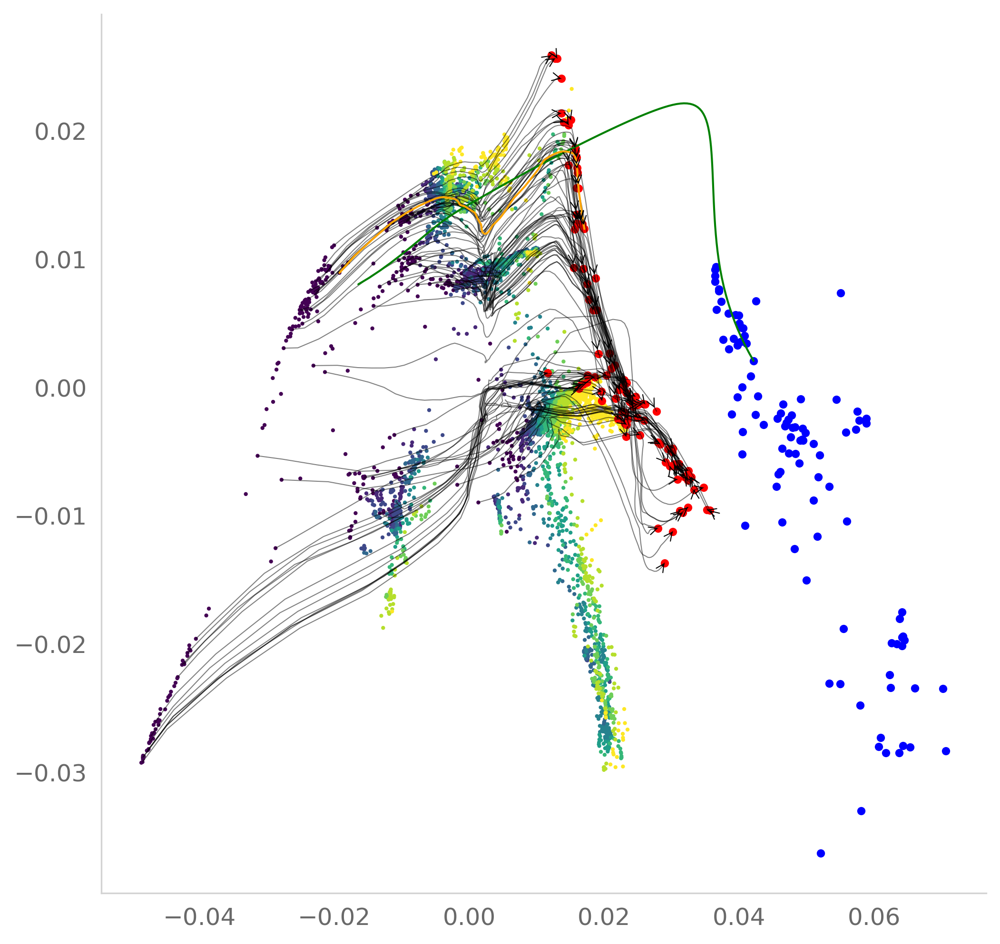

In [62]:
fig = plt.figure(figsize=(8, 8), dpi=300)
plt.scatter(phate_vis[:, 0], phate_vis[:, 1], c=df['samples'].values, cmap='viridis', s=1)
for i,traj in enumerate(np.transpose(trajvis, axes=(1,0,2))):
# for i,traj in enumerate(trajvis):
    plt.plot(traj[:, 0], traj[:, 1], alpha=.5, linewidth=.5, color='Black');
    plt.annotate('', xy=(traj[-1, 0], traj[-1, 1]), xytext=(traj[-2, 0], traj[-2, 1]),
                 arrowprops=dict(arrowstyle='->', color='Black', lw=.5, mutation_scale=10))
plt.scatter(trajendvis[:, 0], trajendvis[:, 1], c='Red', s=10)
plt.scatter(trajend[:, 0], trajend[:, 1], c='Blue', s=10)
plt.plot(unatraj[:, 0], unatraj[:, 1], c='Green', linewidth=1)
plt.plot(unatrajvis[:, 0], unatrajvis[:, 1], c='Orange', linewidth=1)

the model mapping from high dimensional phate to 2d seems to give noisy outputs. for the moment, I would just visualize the first 2 dimensions of the high dimensional phate space.

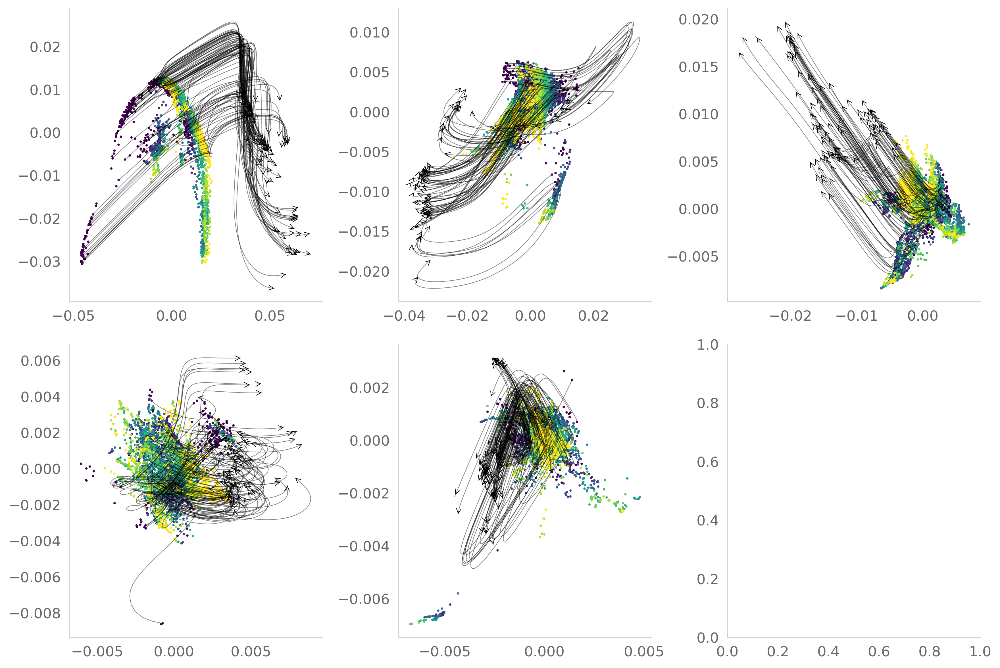

In [63]:
fig, axs = plt.subplots(2, 3, figsize=(12, 8), dpi=300)
dims_list = [[i, i+1] for i in range(0, 10, 2)]
for idx, (dims, ax) in enumerate(zip(dims_list, axs.flat)):
    ax.scatter(true_data.values[:, dims[0]], true_data.values[:, dims[1]], c=df['samples'].values, cmap='viridis', s=1)
    for i,traj in enumerate(np.transpose(trajectoriespts, axes=(1,0,2))):
        # widths = m_traj[:,i]
        ax.plot(traj[:, dims[0]], traj[:, dims[1]], alpha=.5, linewidth=.5, color='Black');
        ax.annotate('', xy=(traj[-1, dims[0]], traj[-1, dims[1]]), xytext=(traj[-2, dims[0]], traj[-2, dims[1]]),
                    arrowprops=dict(arrowstyle='->', color='Black', lw=.5, mutation_scale=10))
plt.tight_layout()


In [64]:
exp_dir

'../../results/adata'

In [65]:
# saving the trajectories and generated points
np.save(os.path.join(exp_dir,'trajectories_phate.npy'),trajectoriespts)
np.save(os.path.join(exp_dir,'generated_phate.npy'),generated)
np.savez(os.path.join(exp_dir, 'normalize.npz'), mean=trajectories, std=std_vals)

In [66]:
torch.save(model, exp_dir + '/model.pt')

In [67]:
torch.save(autoencoder, exp_dir + '/autoencoder.pt')